In [12]:
import pandas as pd
file_name = './data/assist2009_raw/skill_builder_data_corrected.csv'
df = pd.read_csv(file_name, encoding='ISO-8859-1')

/Users/maywzh/.pyenv/versions/3.8.6/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (17) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [16]:
import matplotlib.pyplot as plt


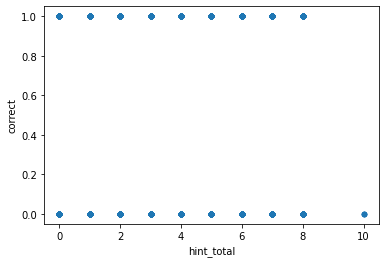

In [22]:

dfnonna =df.dropna(axis=0,how='any',subset=["hint_total"])
fig = dfnonna.plot.scatter("hint_total","correct").get_figure()
fig.savefig('hint_total1.pdf',format="pdf",dpi=300)


In [132]:
import pandas as pd
from tqdm import tqdm
file_name = './data/assist2009_raw/skill_builder_data_corrected.csv'

pickle_data = {}
students = {}
students_list = []
skills = []
users_id = []
max_steps = -1
min_steps = float('inf')
features = ['assignment_id', 'assistment_id', 'problem_id', 'user_id', 'original', 'correct', 'attempt_count',
            'ms_first_response',
            'skill_id', 'hint_count', 'hint_total', 'first_action', 'bottom_hint']

selected_features = ['skill_id', 'correct',
                     'hint_count', 'first_action', 'hint_total', 'attempt_count']

all_data = pd.read_csv(file_name, encoding='ISO-8859-1',low_memory=False)
filtered_data = all_data.dropna(
    axis=0, how='any', subset=selected_features)[features]
filtered_data = filtered_data[filtered_data['ms_first_response'] > 0]
filtered_data = filtered_data.fillna(-1)




In [34]:
filtered_data

,assignment_id,assistment_id,problem_id,user_id,original,correct,attempt_count,ms_first_response,skill_id,hint_count,hint_total,first_action,bottom_hint
0,277618,33139,51424,64525,1,1,1,32454,1.0,0,3,0,-1.0
1,277618,33150,51435,64525,1,1,1,4922,1.0,0,3,0,-1.0
2,220674,33159,51444,70363,1,0,2,25390,1.0,0,3,0,-1.0
3,220674,33110,51395,70363,1,1,1,4859,1.0,0,3,0,-1.0
4,220674,33196,51481,70363,1,0,14,19813,1.0,3,4,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
337996,277900,69042,128442,85730,1,0,2,51016,378.0,0,4,0,-1.0
337997,277900,69056,128456,85730,1,1,1,61547,378.0,0,4,0,-1.0
337998,277900,69046,128446,85730,1,1,1,53890,378.0,0,4,0,-1.0
337999,277901,69057,128457,85730,1,0,4,181532,378.0,3,3,0,1.0


In [133]:
for index, row in filtered_data.iterrows():
    if row['skill_id'] == -1:
        continue
    if row['skill_id'] not in skills:
        skills.append(int(row['skill_id']))
    if row['user_id'] not in users_id:
        users_id.append(int(row['user_id']))
    if row['user_id'] in students:
        students[row['user_id']].append(
            row[selected_features].values.tolist())
    else:
        students[row['user_id']] = [
            row[selected_features].values.tolist()]


In [134]:
import pickle
pickle_data['students'] = students
pickle_data['skills'] = skills
pickle_data['users_id'] = users_id
pickling_on = open("students.pickle", "wb")
pickle.dump(pickle_data, pickling_on)
pickling_on.close()

In [135]:
for user_id in users_id:
    user_log = students[user_id]
    len_user_log = len(user_log)
    if len_user_log > max_steps:
        max_steps = len_user_log
    if len_user_log < min_steps:
        min_steps = len_user_log
    if len_user_log <= 2:
        del students[user_id]
    else:
        students_list.append(user_log)
        

In [137]:
students

{64525.0: [[1.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [1.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [2.0, 0.0, 3.0, 0.0, 3.0, 5.0],
  [2.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [2.0, 0.0, 0.0, 0.0, 0.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [2.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [4.0, 1.0, 0.0, 0.0, 4.0, 1.0],
  [4.0, 1.0, 0.0, 0.0, 4.0, 1.0],
  [4.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [5.0, 1.0, 0.0, 0.0, 4.0, 1.0],
  [5.0, 1.0, 0.0, 0.0, 5.0, 1.0],
  [5.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [8.0, 1.0, 0.0, 0.0, 4.0, 1.0],
  [8.0, 1.0, 0.0, 0.0, 4.0, 1.0],
  [9.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [9.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [9.0, 1.0, 0.0, 0.0, 3.0, 1.0],
  [10.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [10.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  [10.0, 1.0, 0.0, 0.0, 0.0, 1.0],
  

In [ ]:
import numpy as np
with open('assist2009.csv','w') as f:
    for studentlog in students_list:
        npstudentlog = np.array(studentlog,dtype=np.int32).transpose()
        f.write(str(npstudentlog.shape[1])+"\n")
        for ls in npstudentlog:
            torec =  ','.join(str(num) for num in ls)
            f.write(torec+"\n")

In [51]:
a.transpose().shape

(6, 742)

<AxesSubplot:xlabel='answer_type', ylabel='correct'>

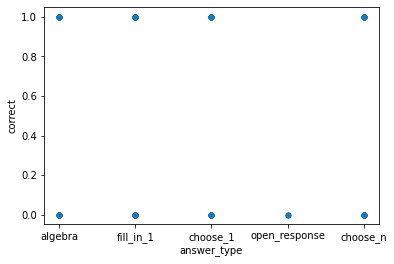

In [37]:
dfnonna =df.dropna(axis=0,how='any',subset=["answer_type"])
dfnonna.plot.scatter("answer_type","correct")

<AxesSubplot:>

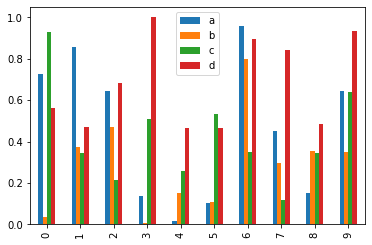

In [53]:
df2 = pd.DataFrame(np.random.rand(10, 4), columns=['a', 'b', 'c', 'd'])

df2.plot.bar()

In [70]:
df2
df2.corr()

,a,b,c,d
a,1.000000,0.626871,0.139059,0.244698
b,0.626871,1.000000,-0.447883,0.224918
c,0.139059,-0.447883,1.000000,0.001619
d,0.244698,0.224918,0.001619,1.000000


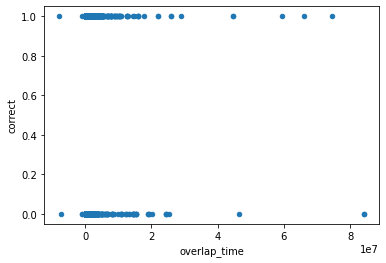

In [69]:

dfnonna =df.dropna(axis=0,how='any',subset=["overlap_time"])
fig = dfnonna.plot.scatter("overlap_time","correct")



In [71]:
df.corr()

,order_id,assignment_id,user_id,assistment_id,problem_id,original,correct,attempt_count,ms_first_response,sequence_id,...,school_id,hint_count,hint_total,overlap_time,template_id,answer_id,first_action,bottom_hint,opportunity,opportunity_original
order_id,1.000000,0.798818,0.637550,0.084935,0.085225,0.002705,0.012969,-0.002727,0.004944,0.003509,...,0.037803,0.008453,-0.015732,0.000210,0.076120,0.099222,0.002047,0.102326,0.113788,0.080042
assignment_id,0.798818,1.000000,0.664820,0.082664,0.081154,0.018835,0.035203,-0.004297,0.005152,0.015625,...,0.080716,-0.008035,-0.002308,0.002296,0.081721,0.104650,-0.014347,0.059409,0.081621,0.064730
user_id,0.637550,0.664820,1.000000,0.054959,0.054580,-0.036704,-0.026099,0.003212,0.005615,0.016946,...,0.323528,0.027650,-0.003507,0.006441,0.032290,0.089780,0.035569,0.034120,0.048593,0.038454
assistment_id,0.084935,0.082664,0.054959,1.000000,0.994842,0.112400,0.029433,0.004275,-0.002261,0.515332,...,0.136776,0.002372,-0.088670,0.000259,0.814630,0.956259,-0.033545,0.142743,0.157216,0.128774
problem_id,0.085225,0.081154,0.054580,0.994842,1.000000,0.102945,0.032532,0.004032,-0.003570,0.503505,...,0.134968,-0.002979,-0.088779,-0.001270,0.805324,0.969235,-0.036408,0.139245,0.152843,0.123958
original,0.002705,0.018835,-0.036704,0.112400,0.102945,1.000000,0.051919,-0.010758,0.035648,0.128626,...,-0.028347,-0.120653,-0.053629,0.030047,0.093282,-0.331997,-0.051397,-0.095217,-0.111289,NaN
correct,0.012969,0.035203,-0.026099,0.029433,0.032532,0.051919,1.000000,-0.065510,-0.010513,0.026658,...,-0.055808,-0.550850,-0.098359,-0.052643,0.027181,0.155178,-0.442666,-0.024234,-0.015931,-0.007516
attempt_count,-0.002727,-0.004297,0.003212,0.004275,0.004032,-0.010758,-0.065510,1.000000,0.001749,0.005481,...,0.008397,0.055115,0.033265,0.019660,0.002435,-0.041255,-0.013847,-0.001038,-0.001720,-0.001478
ms_first_response,0.004944,0.005152,0.005615,-0.002261,-0.003570,0.035648,-0.010513,0.001749,1.000000,-0.009557,...,-0.003736,-0.004244,-0.010947,0.951066,0.009300,-0.015369,-0.007832,-0.028605,-0.011293,-0.007968
sequence_id,0.003509,0.015625,0.016946,0.515332,0.503505,0.128626,0.026658,0.005481,-0.009557,1.000000,...,0.307473,0.013789,0.066774,-0.008904,0.369087,0.132089,-0.004478,0.090443,0.096344,0.089687


In [104]:
import pandas as pd
file_name = './data/assist2009_raw/skill_builder_data_corrected.csv'
df = pd.read_csv(file_name, encoding='ISO-8859-1',low_memory=False)
selected_features = ['correct', 'attempt_count', 'ms_first_response','tutor_mode','answer_type',
                   'position', 'hint_count','hint_total','overlap_time','first_action','bottom_hint','opportunity' ]
sedf = df[selected_features]

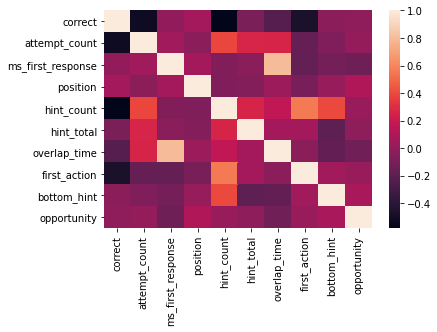

In [107]:

import seaborn as sns
fig = sns.heatmap(sedf.corr(method="kendall"))
fig.get_figure().savefig('./figs/fig1.pdf', format='pdf', dpi = 400, bbox_inches='tight')

In [108]:
sedf.corr()

,correct,attempt_count,ms_first_response,position,hint_count,hint_total,overlap_time,first_action,bottom_hint,opportunity
correct,1.000000,-0.065510,-0.010513,0.057885,-0.550850,-0.098359,-0.052643,-0.442666,-0.024234,-0.015931
attempt_count,-0.065510,1.000000,0.001749,-0.011680,0.055115,0.033265,0.019660,-0.013847,-0.001038,-0.001720
ms_first_response,-0.010513,0.001749,1.000000,0.015720,-0.004244,-0.010947,0.951066,-0.007832,-0.028605,-0.011293
position,0.057885,-0.011680,0.015720,1.000000,-0.064067,-0.091059,0.009304,-0.082489,0.006115,0.046474
hint_count,-0.550850,0.055115,-0.004244,-0.064067,1.000000,0.330246,0.038822,0.410284,0.434511,0.018670
hint_total,-0.098359,0.033265,-0.010947,-0.091059,0.330246,1.000000,0.012363,0.008851,-0.209224,0.016096
overlap_time,-0.052643,0.019660,0.951066,0.009304,0.038822,0.012363,1.000000,0.001716,-0.061941,-0.013107
first_action,-0.442666,-0.013847,-0.007832,-0.082489,0.410284,0.008851,0.001716,1.000000,0.055151,0.003566
bottom_hint,-0.024234,-0.001038,-0.028605,0.006115,0.434511,-0.209224,-0.061941,0.055151,1.000000,0.082733
opportunity,-0.015931,-0.001720,-0.011293,0.046474,0.018670,0.016096,-0.013107,0.003566,0.082733,1.000000


/Users/maywzh/.pyenv/versions/3.8.6/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


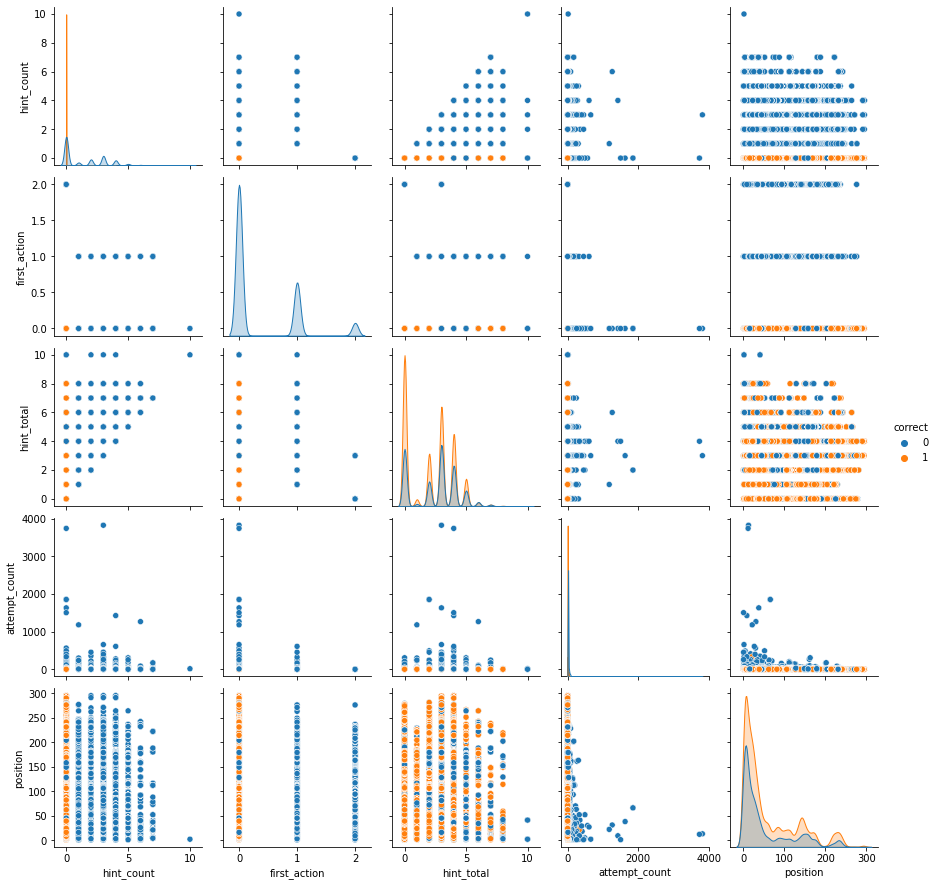

In [112]:
sns.pairplot(sedf[['correct','hint_count','first_action','hint_total','attempt_count']],hue ='correct')

/Users/maywzh/.pyenv/versions/3.8.6/lib/python3.8/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


AttributeError: 'PairGrid' object has no attribute 'get_figure'

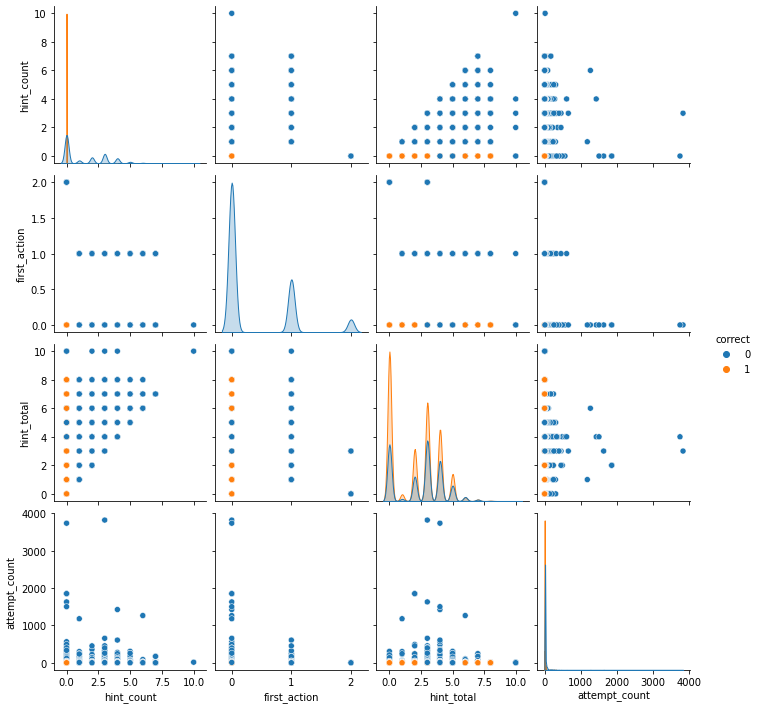

In [114]:
fig2 =sns.pairplot(sedf[['correct','hint_count','first_action','hint_total','attempt_count']],hue ='correct')
fig2.get_figure().savefig('./figs/fig2.pdf', format='pdf', dpi = 400, bbox_inches='tight')

In [116]:
fig2.savefig('./figs/fig2.png', format='png', dpi = 300, bbox_inches='tight')

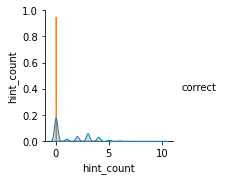

In [120]:
fig3 =sns.pairplot(sedf[['correct','hint_count']],hue ='correct')
fig3.savefig('./figs/fig3.pdf', format='pdf', dpi = 400, bbox_inches='tight')

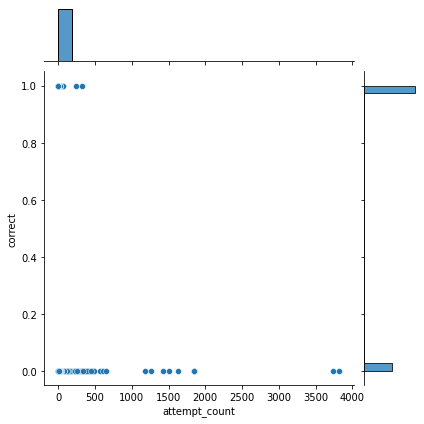

In [131]:
fig4 = sns.jointplot(x = 'attempt_count', y = 'correct', data = sedf)
fig4.savefig('./figs/fig4.png', format='png', dpi = 400, bbox_inches='tight')

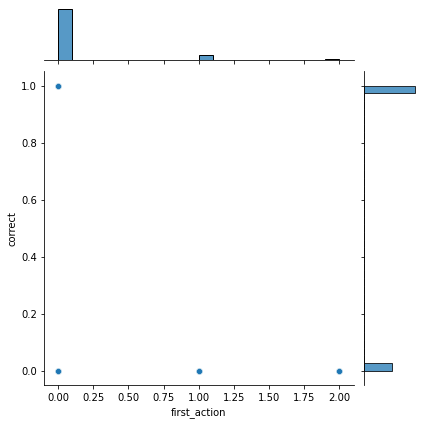

In [129]:
fig4 = sns.jointplot(x = 'first_action', y = 'correct', data = sedf)
fig4.savefig('./figs/fig4.png', format='png', dpi = 400, bbox_inches='tight')

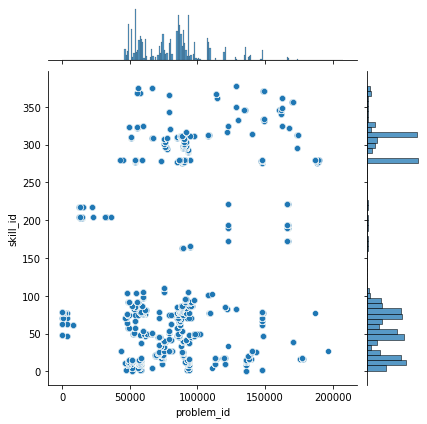

In [125]:
fig4 = sns.jointplot(x = 'problem_id', y = 'skill_id', data = df)


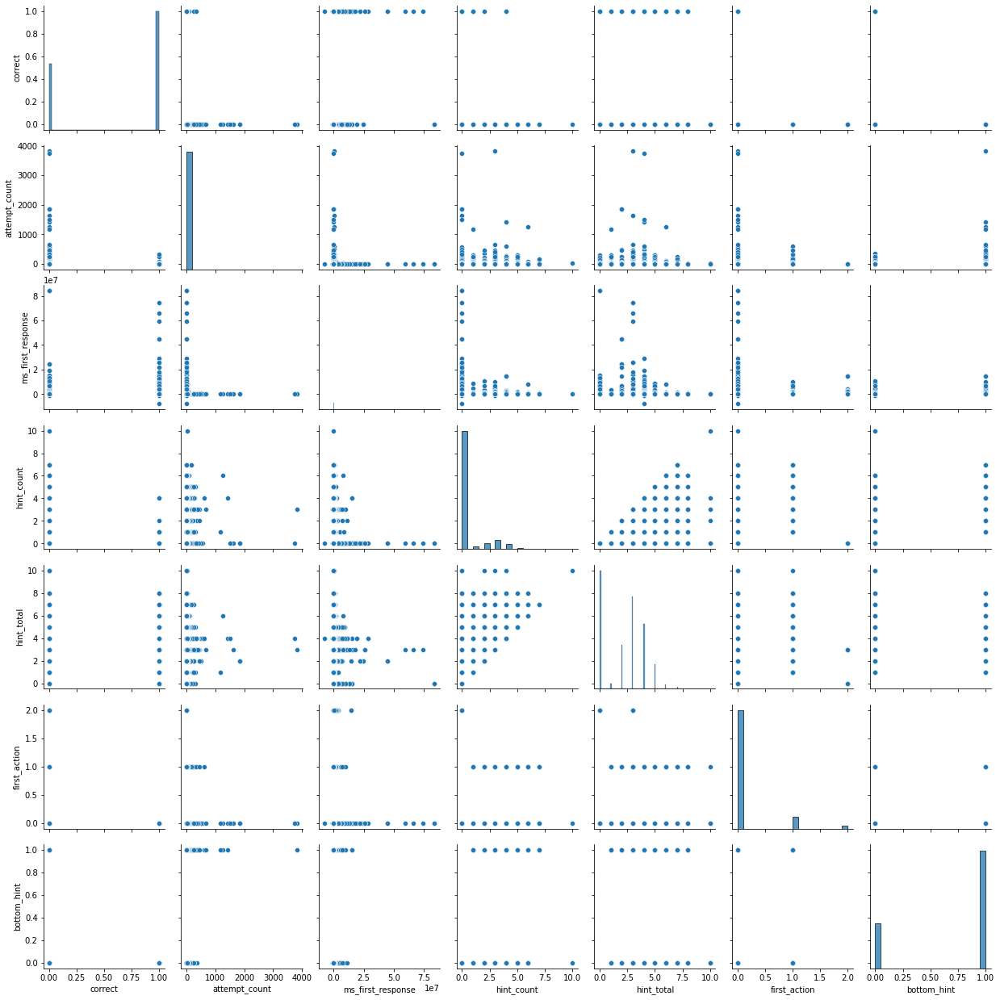

In [82]:
sns.pairplot(sedf)

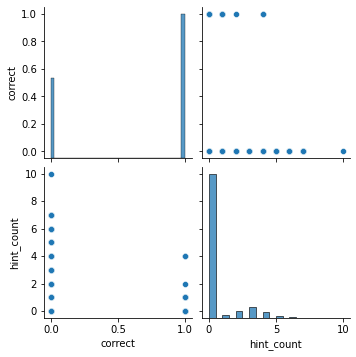

In [118]:
sdf2 = df[[ 'correct', 'hint_count']]
sns.pairplot(sdf2)

<AxesSubplot:xlabel='attempt_count', ylabel='Density'>

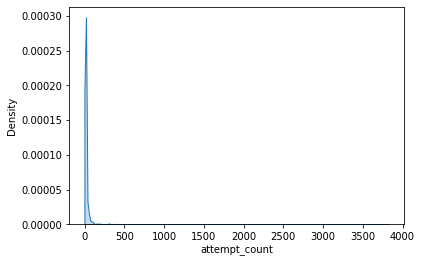

In [89]:

sns.kdeplot(df['attempt_count'], shade=True)

,attempt_count,hint_count,correct
0,1,0,1
1,1,0,1
2,2,0,0
3,1,0,1
4,14,3,0
...,...,...,...
401751,1,0,1
401752,1,0,1
401753,1,0,1
401754,1,0,1


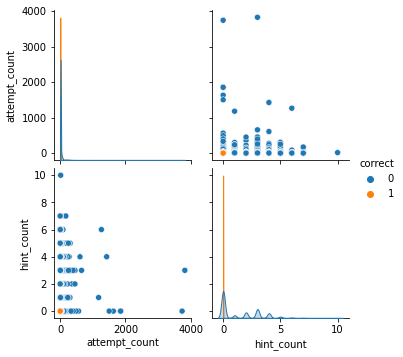

In [100]:
dfa = df.dropna(axis=0,how='any',subset=['attempt_count','hint_count','correct'])[['attempt_count','hint_count','correct']]
sns.pairplot(dfa ,hue ='correct')
dfa

NameError: name 'sdf2' is not defined